In [1]:
import sys
from pathlib import Path

# In notebook
root_dir = Path().resolve().parents[1]  # Adjust if needed
sys.path.append(str(root_dir))

from utils import *

In [3]:
data_dir = '../data'
image_dir = '../images'
data_file_name = "BankChurners.csv"

In [4]:
import pandas as pd
import numpy as np
import os

In [5]:
is_running_colab()

False

In [6]:
# %load info_dataframes.md

In [7]:
df_original = pd.read_csv(f"{data_dir}/{data_file_name}")

In [8]:
#os.getcwd()

In [9]:
df_original.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [10]:
(df_original['Dependent_count']<=3).sum()/df_original.shape[0]

np.float64(0.8027056383924163)

In [11]:
38.9+46.3

85.19999999999999

In [12]:
df_original[df_original['Marital_Status'].isin(['Married', 'Single'])]['Marital_Status'].count()/df_original.shape[0]

np.float64(0.852177347684408)

In [13]:
ddict_str = """CLIENTNUM: Client number. Unique identifier for the customer holding the account
Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
Customer_Age: Age in Years
Gender: Gender of the account holder
Dependent_count: Number of dependents
Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
Marital_Status: Marital Status of the account holder
Income_Category: Annual Income Category of the account holder
Card_Category: Type of Card
Months_on_book: Period of relationship with the bank (in months)
Total_Relationship_Count: Total no. of products held by the customer
Months_Inactive_12_mon: No. of months inactive in the last 12 months
Contacts_Count_12_mon: No. of Contacts in the last 12 months
Credit_Limit: Credit Limit on the Credit Card
Total_Revolving_Bal: Total Revolving Balance on the Credit Card
Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
Total_Trans_Amt: Total Transaction Amount (Last 12 months)
Total_Trans_Ct: Total Transaction Count (Last 12 months)
Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
Avg_Utilization_Ratio: Average Card Utilization Ratio"""

In [14]:
def modify_varname(name):
  name = name.replace('_', ' ')
  conv = {' Amt': ' Amount',
          ' Chng': ' Change',
          ' Bal': ' Balance',
          ' mon': ' Months',
          ' Trans': ' Transaction',
          'Q4 Q1': 'Q4-Q1',
          ' To ': ' to ',
          ' Ct': ' Count'}
  for k, v in conv.items():
    if k in name:
      name = name.replace(k, v)
  return name

# for c in df_original.columns:
#   print(modify_varname(c))

In [15]:
df = df_original.copy()

df.replace({'Income_Category': {'abc': np.nan}}, inplace=True)
df['Attrition_Flag'] = df['Attrition_Flag'].map({
              'Existing Customer': 'Existing',
              'Attrited Customer': 'Attrited'})

df = impute_data(df)

# ddict_str = """"""

modify_dict = {}
positive_cols = []
feature_info = {}
drop_cols = [] + ['CLIENTNUM']
type_conv = {'Attrition_Flag': 'category',
 'Card_Category': 'category',
 'Contacts_Count_12_mon': 'category',
 'Dependent_count': 'category',
 'Education_Level': 'category',
 'Gender': 'category',
 'Income_Category': 'category',
 'Marital_Status': 'category',
 'Months_Inactive_12_mon': 'category',
 'Total_Relationship_Count': 'category'}

cat_orders = {}

cat_orders.update({'Card_Category': ['Blue', 'Silver', 'Gold', 'Platinum']})

for col in ['Months_Inactive_12_mon', 'Contacts_Count_12_mon',
            'Total_Relationship_Count', 'Dependent_count']:
  cat_orders.update({col: sorted(df[col].unique().tolist())})

marital_status_list = ['Single', 'Married', 'Divorced']
educational_list = ['Uneducated', 'High School', 'College', 'Graduate',
       'Post-Graduate', 'Doctorate']
income_list = ['Less than $40K', '$40K - $60K', '$60K - $80K', '$80K - $120K', '$120K +']

cat_orders.update({'Marital_Status': marital_status_list})
cat_orders.update({'Education_Level' : educational_list})
cat_orders.update({'Income_Category' : income_list})

In [16]:
dfout = create_info_conduct_eda(df.copy(), positive_cols = positive_cols,
                        type_conv = type_conv,
                        feature_info = feature_info,
                  modify_dict = modify_dict,
                            drop_cols = drop_cols, ddict_str = ddict_str,
                             cat_orders=cat_orders, to_plot=False)

Recommendations:
------------------------------------------------------------------------------------------------------------------------
Convert to category: 
type_conv =
{'Attrition_Flag': 'category',
 'Card_Category': 'category',
 'Contacts_Count_12_mon': 'category',
 'Dependent_count': 'category',
 'Education_Level': 'category',
 'Education_Level (missing)': 'category',
 'Gender': 'category',
 'Income_Category': 'category',
 'Income_Category (missing)': 'category',
 'Marital_Status': 'category',
 'Marital_Status (missing)': 'category',
 'Months_Inactive_12_mon': 'category',
 'Total_Relationship_Count': 'category'}
cat_orders = 
{'Education_Level': []}
drop_cols = [] + ['CLIENTNUM']
------------------------------------------------------------------------------------------------------------------------
There are 10,127 (~10K) _rows_ and 24 _columns_ in the dataset.

The __memory usage__ is approximately  1898.9 KB.

There are _3,380 null values_ in the dataset. 14.999506270366346% of

,Data Type,Description,# unique
Column,,,
CLIENTNUM,int64,Client number. Unique identifier for the custo...,10127
Attrition_Flag,object,Internal event (customer activity) variable - ...,2
Customer_Age,int64,Age in Years,45
Gender,object,Gender of the account holder,2
Dependent_count,int64,Number of dependents,6
Education_Level,object,Educational Qualification of the account holde...,6
Marital_Status,object,Marital Status of the account holder,3
Income_Category,object,Annual Income Category of the account holder,5
Card_Category,object,Type of Card,4


,
Memory Usage,1898.9 KB
,
#,
Rows,10127
Columns,24
Null Values,3380
Duplicated Rows,0
,
int64,10
object,9


,# Null
Education_Level (missing),1519
Income_Category (missing),1112
Marital_Status (missing),749


,Data Type,Description,# unique
Column,,,
Attrition_Flag,category,Internal event (customer activity) variable - ...,2
Customer_Age,int64,Age in Years,45
Gender,category,Gender of the account holder,2
Dependent_count,category,Number of dependents,6
Education_Level,category,Educational Qualification of the account holde...,6
Marital_Status,category,Marital Status of the account holder,3
Income_Category,category,Annual Income Category of the account holder,5
Card_Category,category,Type of Card,4
Months_on_book,int64,Period of relationship with the bank (in months),44


,
Memory Usage,1129.7 KB
,
#,
Rows,10127
Columns,23
Null Values,3380
Duplicated Rows,0
,
category,10
int64,5


,# Null
Education_Level (missing),1519
Income_Category (missing),1112
Marital_Status (missing),749


,unique,top,freq
Object/Categorical Column,,,
Attrition_Flag,2,Existing,8500
Gender,2,F,5358
Dependent_count,6,3,2732
Education_Level,6,Graduate,4647
Marital_Status,3,Married,5436
Income_Category,5,Less than $40K,4673
Card_Category,4,Blue,9436
Total_Relationship_Count,6,3,2305
Months_Inactive_12_mon,7,3,3846


,mean,std,min,25%,50%,75%,max,IQR,# Outliers (Upper),# Outliers (Lower),# Outliers,Outliers %
Numerical Column,,,,,,,,,,,,
Customer_Age,46.3,8.0,26.0,41.000,46.000,52.000,73.000,11.000,2,0,2,0.0
Months_on_book,35.9,8.0,13.0,31.000,36.000,40.000,56.000,9.000,198,188,386,3.8
Credit_Limit,8632.0,9088.8,1438.3,2555.000,4549.000,11067.500,34516.000,8512.500,984,0,984,9.7
Total_Revolving_Bal,1162.8,815.0,0.0,359.000,1276.000,1784.000,2517.000,1425.000,0,0,0,0.0
Avg_Open_To_Buy,7469.1,9090.7,3.0,1324.500,3474.000,9859.000,34516.000,8534.500,963,0,963,9.5
Total_Amt_Chng_Q4_Q1,0.8,0.2,0.0,0.631,0.736,0.859,3.397,0.228,350,48,398,3.9
Total_Trans_Amt,4404.1,3397.1,510.0,2155.500,3899.000,4741.000,18484.000,2585.500,896,0,896,8.8
Total_Trans_Ct,64.9,23.5,10.0,45.000,67.000,81.000,139.000,36.000,2,0,2,0.0
Total_Ct_Chng_Q4_Q1,0.7,0.2,0.0,0.582,0.702,0.818,3.714,0.236,300,96,396,3.9


Information is written to info_dataframes.md


Recommendations:
------------------------------------------------------------------------------------------------------------------------
Convert to category: 
type_conv =
{'Attrition_Flag': 'category',
 'Card_Category': 'category',
 'Contacts_Count_12_mon': 'category',
 'Dependent_count': 'category',
 'Education_Level': 'category',
 'Education_Level (missing)': 'category',
 'Gender': 'category',
 'Income_Category': 'category',
 'Income_Category (missing)': 'category',
 'Marital_Status': 'category',
 'Marital_Status (missing)': 'category',
 'Months_Inactive_12_mon': 'category',
 'Total_Relationship_Count': 'category'}
cat_orders = 
{'Education_Level': []}
drop_cols = [] + ['CLIENTNUM']
------------------------------------------------------------------------------------------------------------------------
There are 10,127 (~10K) _rows_ and 24 _columns_ in the dataset.

The __memory usage__ is approximately  1898.9 KB.

There are _3,380 null values_ in the dataset. 14.999506270366346% of

,Data Type,Description,# unique
Column,,,
CLIENTNUM,int64,Client number. Unique identifier for the custo...,10127
Attrition_Flag,object,Internal event (customer activity) variable - ...,2
Customer_Age,int64,Age in Years,45
Gender,object,Gender of the account holder,2
Dependent_count,int64,Number of dependents,6
Education_Level,object,Educational Qualification of the account holde...,6
Marital_Status,object,Marital Status of the account holder,3
Income_Category,object,Annual Income Category of the account holder,5
Card_Category,object,Type of Card,4


,
Memory Usage,1898.9 KB
,
#,
Rows,10127
Columns,24
Null Values,3380
Duplicated Rows,0
,
int64,10
object,9


,# Null
Education_Level (missing),1519
Income_Category (missing),1112
Marital_Status (missing),749


,Data Type,Description,# unique
Column,,,
Attrition_Flag,category,Internal event (customer activity) variable - ...,2
Customer_Age,int64,Age in Years,45
Gender,category,Gender of the account holder,2
Dependent_count,category,Number of dependents,6
Education_Level,category,Educational Qualification of the account holde...,6
Marital_Status,category,Marital Status of the account holder,3
Income_Category,category,Annual Income Category of the account holder,5
Card_Category,category,Type of Card,4
Months_on_book,int64,Period of relationship with the bank (in months),44


,
Memory Usage,1129.7 KB
,
#,
Rows,10127
Columns,23
Null Values,3380
Duplicated Rows,0
,
category,10
int64,5


,# Null
Education_Level (missing),1519
Income_Category (missing),1112
Marital_Status (missing),749


,unique,top,freq
Object/Categorical Column,,,
Attrition_Flag,2,Existing,8500
Gender,2,F,5358
Dependent_count,6,3,2732
Education_Level,6,Graduate,4647
Marital_Status,3,Married,5436
Income_Category,5,Less than $40K,4673
Card_Category,4,Blue,9436
Total_Relationship_Count,6,3,2305
Months_Inactive_12_mon,7,3,3846


,mean,std,min,25%,50%,75%,max,IQR,# Outliers (Upper),# Outliers (Lower),# Outliers,Outliers %
Numerical Column,,,,,,,,,,,,
Customer_Age,46.3,8.0,26.0,41.000,46.000,52.000,73.000,11.000,2,0,2,0.0
Months_on_book,35.9,8.0,13.0,31.000,36.000,40.000,56.000,9.000,198,188,386,3.8
Credit_Limit,8632.0,9088.8,1438.3,2555.000,4549.000,11067.500,34516.000,8512.500,984,0,984,9.7
Total_Revolving_Bal,1162.8,815.0,0.0,359.000,1276.000,1784.000,2517.000,1425.000,0,0,0,0.0
Avg_Open_To_Buy,7469.1,9090.7,3.0,1324.500,3474.000,9859.000,34516.000,8534.500,963,0,963,9.5
Total_Amt_Chng_Q4_Q1,0.8,0.2,0.0,0.631,0.736,0.859,3.397,0.228,350,48,398,3.9
Total_Trans_Amt,4404.1,3397.1,510.0,2155.500,3899.000,4741.000,18484.000,2585.500,896,0,896,8.8
Total_Trans_Ct,64.9,23.5,10.0,45.000,67.000,81.000,139.000,36.000,2,0,2,0.0
Total_Ct_Chng_Q4_Q1,0.7,0.2,0.0,0.582,0.702,0.818,3.714,0.236,300,96,396,3.9


Information is written to info_dataframes.md

Attrition_Flag
The most common value in Attrition_Flag is Existing (83.9%).

Card_Category
The most common value in Card_Category is Blue (93.2%) followed by Silver (5.5%).

Contacts_Count_12_mon
The most common value in Contacts_Count_12_mon is 3 (33.4%) followed by 2 (31.9%).

Dependent_count
The most common value in Dependent_count is 3 (27.0%) followed by 2 (26.2%).

Education_Level
The most common value in Education_Level is Graduate (45.9%) followed by High School (19.9%).

Education_Level (missing)
The most common value in Education_Level (missing) is Graduate (30.9%) followed by High School (19.9%).

Gender
The most common value in Gender is F (52.9%).

Income_Category
The most common value in Income_Category is Less than $40K (46.1%) followed by $40K - $60K (17.7%).

Income_Category (missing)
The most common value in Income_Category (missing) is Less than $40K (35.2%) followed by $40K - $60K (17.7%).

Marital_Status
The most common

,Variable 1,Variable 2,Correlation
0,Avg_Open_To_Buy,Credit_Limit,0.995981
1,Total_Trans_Amt,Total_Trans_Ct,0.807192
2,Customer_Age,Months_on_book,0.788912
3,Avg_Utilization_Ratio,Total_Revolving_Bal,0.624022
4,Total_Amt_Chng_Q4_Q1,Total_Ct_Chng_Q4_Q1,0.384189
5,Credit_Limit,Total_Trans_Amt,0.171730
6,Avg_Open_To_Buy,Total_Trans_Amt,0.165923
7,Total_Ct_Chng_Q4_Q1,Total_Trans_Ct,0.112324
8,Total_Ct_Chng_Q4_Q1,Total_Revolving_Bal,0.089861
9,Total_Ct_Chng_Q4_Q1,Total_Trans_Amt,0.085581


,Attrition_Flag,Card_Category,Contacts_Count_12_mon,Dependent_count,Education_Level (missing),Gender,Income_Category (missing),Marital_Status (missing),Months_Inactive_12_mon,Total_Relationship_Count
Attrition_Flag,1.000000,0.000235,0.060544,0.001058,0.001332,0.001582,0.001467,0.000679,0.049972,0.029907
Card_Category,0.000235,1.000000,0.003879,0.004246,0.003267,0.012908,0.016275,0.005567,0.002820,0.022740
Contacts_Count_12_mon,0.060544,0.003879,1.000000,0.001463,0.000571,0.001352,0.001342,0.000705,0.001747,0.011501
Dependent_count,0.001058,0.004246,0.001463,1.000000,0.000903,0.000111,0.003771,0.001722,0.000733,0.001351
Education_Level (missing),0.001332,0.003267,0.000571,0.000903,1.000000,0.000203,0.001231,0.000593,0.000816,0.000817
Gender,0.001582,0.012908,0.001352,0.000111,0.000203,1.000000,0.656085,0.000277,0.000693,0.000314
Income_Category (missing),0.001467,0.016275,0.001342,0.003771,0.001231,0.656085,1.000000,0.000502,0.001337,0.000819
Marital_Status (missing),0.000679,0.005567,0.000705,0.001722,0.000593,0.000277,0.000502,1.000000,0.001055,0.001308
Months_Inactive_12_mon,0.049972,0.002820,0.001747,0.000733,0.000816,0.000693,0.001337,0.001055,1.000000,0.001094
Total_Relationship_Count,0.029907,0.022740,0.011501,0.001351,0.000817,0.000314,0.000819,0.001308,0.001094,1.000000


Gender HAS AN EFFECT on Income_Category (missing) as the p_value 0.0e+00 < 0.05.
Attrition_Flag HAS AN EFFECT on Contacts_Count_12_mon as the p_value 1.8e-123 < 0.05.
Attrition_Flag HAS AN EFFECT on Months_Inactive_12_mon as the p_value 1.6e-82 < 0.05.
Attrition_Flag HAS AN EFFECT on Total_Relationship_Count as the p_value 2.7e-59 < 0.05.
Contacts_Count_12_mon HAS AN EFFECT on Total_Relationship_Count as the p_value 3.5e-51 < 0.05.
Card_Category HAS AN EFFECT on Total_Relationship_Count as the p_value 1.6e-24 < 0.05.
Card_Category HAS AN EFFECT on Gender as the p_value 3.6e-16 < 0.05.
Card_Category HAS AN EFFECT on Income_Category (missing) as the p_value 1.2e-14 < 0.05.
Dependent_count HAS AN EFFECT on Income_Category (missing) as the p_value 2.4e-14 < 0.05.
Contacts_Count_12_mon HAS AN EFFECT on Gender as the p_value 2.6e-07 < 0.05.
Dependent_count HAS AN EFFECT on Marital_Status (missing) as the p_value 1.1e-06 < 0.05.
Card_Category HAS AN EFFECT on Marital_Status (missing) as the p

,Category 1,Category 2,p-value
0,Gender,Income_Category (missing),0.0e+00
1,Attrition_Flag,Contacts_Count_12_mon,1.8e-123
2,Attrition_Flag,Months_Inactive_12_mon,1.6e-82
3,Attrition_Flag,Total_Relationship_Count,2.7e-59
4,Contacts_Count_12_mon,Total_Relationship_Count,3.5e-51
5,Card_Category,Total_Relationship_Count,1.6e-24
6,Card_Category,Gender,3.6e-16
7,Card_Category,Income_Category (missing),1.2e-14
8,Dependent_count,Income_Category (missing),2.4e-14
9,Contacts_Count_12_mon,Gender,2.6e-07


Income_Category (missing) HAS AN EFFECT on Credit_Limit as the One-Way ANOVA F-test p_value 0.0e+00 < 0.05.
Income_Category (missing) HAS AN EFFECT on Avg_Open_To_Buy as the One-Way ANOVA F-test p_value 0.0e+00 < 0.05.
Total_Relationship_Count HAS AN EFFECT on Total_Trans_Amt as the One-Way ANOVA F-test p_value 0.0e+00 < 0.05.
Gender HAS AN EFFECT on Avg_Open_To_Buy as the Two-Sample T-Test p_value 0.0e+00 < 0.05.
Attrition_Flag HAS AN EFFECT on Total_Trans_Ct as the Two-Sample T-Test p_value 0.0e+00 < 0.05.
Card_Category HAS AN EFFECT on Avg_Open_To_Buy as the One-Way ANOVA F-test p_value 0.0e+00 < 0.05.
Card_Category HAS AN EFFECT on Credit_Limit as the One-Way ANOVA F-test p_value 0.0e+00 < 0.05.
Gender HAS AN EFFECT on Credit_Limit as the Two-Sample T-Test p_value 0.0e+00 < 0.05.
Income_Category (missing) HAS AN EFFECT on Avg_Utilization_Ratio as the One-Way ANOVA F-test p_value 5.0e-258 < 0.05.
Total_Relationship_Count HAS AN EFFECT on Total_Trans_Ct as the One-Way ANOVA F-test p_

,Category,Numerical,p-value
0,Income_Category (missing),Credit_Limit,0.0e+00
1,Income_Category (missing),Avg_Open_To_Buy,0.0e+00
2,Total_Relationship_Count,Total_Trans_Amt,0.0e+00
3,Gender,Avg_Open_To_Buy,0.0e+00
4,Attrition_Flag,Total_Trans_Ct,0.0e+00
...,...,...,...
63,Months_Inactive_12_mon,Avg_Utilization_Ratio,1.9e-02
64,Contacts_Count_12_mon,Avg_Open_To_Buy,3.8e-02
65,Education_Level (missing),Customer_Age,3.8e-02
66,Income_Category (missing),Total_Amt_Chng_Q4_Q1,4.4e-02


Income_Category (missing) HAS AN EFFECT on Credit_Limit as the One-Way ANOVA F-test p_value 0.0e+00 < 0.05.
Income_Category (missing) HAS AN EFFECT on Avg_Open_To_Buy as the One-Way ANOVA F-test p_value 0.0e+00 < 0.05.
Total_Relationship_Count HAS AN EFFECT on Total_Trans_Amt as the One-Way ANOVA F-test p_value 0.0e+00 < 0.05.
Gender HAS AN EFFECT on Avg_Open_To_Buy as the Two-Sample T-Test p_value 0.0e+00 < 0.05.
Attrition_Flag HAS AN EFFECT on Total_Trans_Ct as the Two-Sample T-Test p_value 0.0e+00 < 0.05.
Card_Category HAS AN EFFECT on Avg_Open_To_Buy as the One-Way ANOVA F-test p_value 0.0e+00 < 0.05.
Card_Category HAS AN EFFECT on Credit_Limit as the One-Way ANOVA F-test p_value 0.0e+00 < 0.05.
Gender HAS AN EFFECT on Credit_Limit as the Two-Sample T-Test p_value 0.0e+00 < 0.05.
Income_Category (missing) HAS AN EFFECT on Avg_Utilization_Ratio as the One-Way ANOVA F-test p_value 5.0e-258 < 0.05.
Total_Relationship_Count HAS AN EFFECT on Total_Trans_Ct as the One-Way ANOVA F-test p_

,Category,Numerical,p-value
0,Income_Category (missing),Credit_Limit,0.0e+00
1,Income_Category (missing),Avg_Open_To_Buy,0.0e+00
2,Total_Relationship_Count,Total_Trans_Amt,0.0e+00
3,Gender,Avg_Open_To_Buy,0.0e+00
4,Attrition_Flag,Total_Trans_Ct,0.0e+00
...,...,...,...
63,Months_Inactive_12_mon,Avg_Utilization_Ratio,1.9e-02
64,Contacts_Count_12_mon,Avg_Open_To_Buy,3.8e-02
65,Education_Level (missing),Customer_Age,3.8e-02
66,Income_Category (missing),Total_Amt_Chng_Q4_Q1,4.4e-02


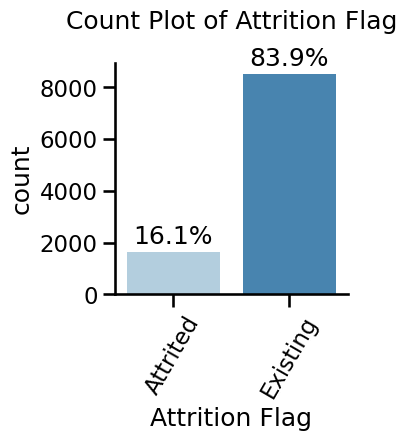

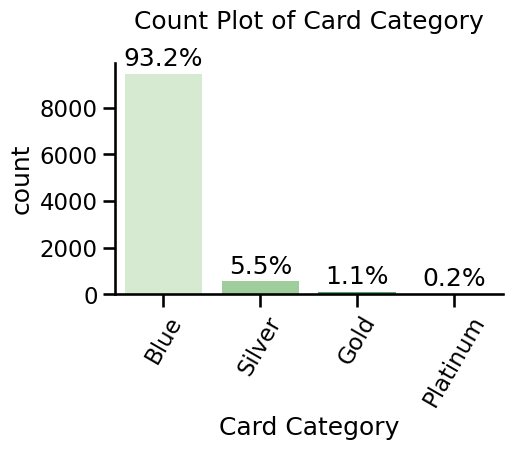

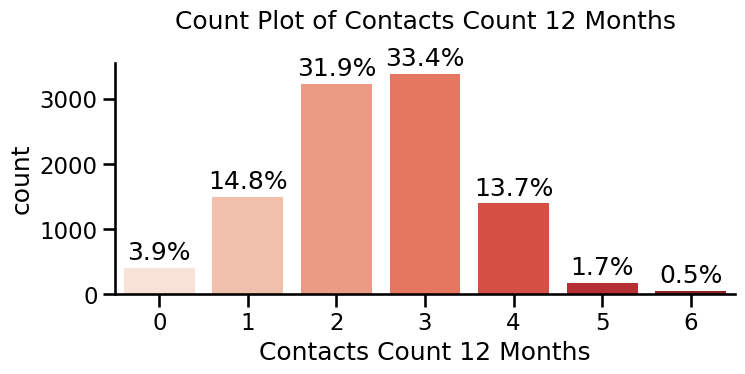

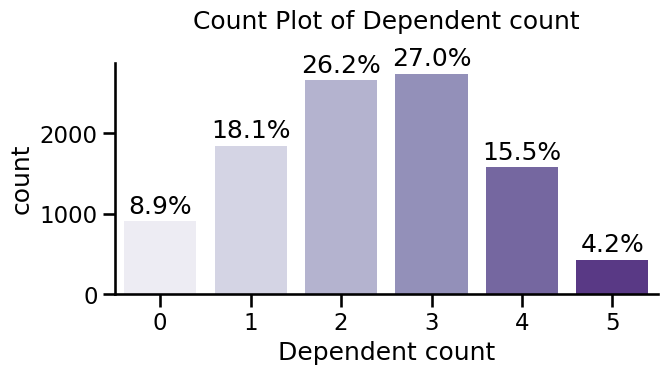

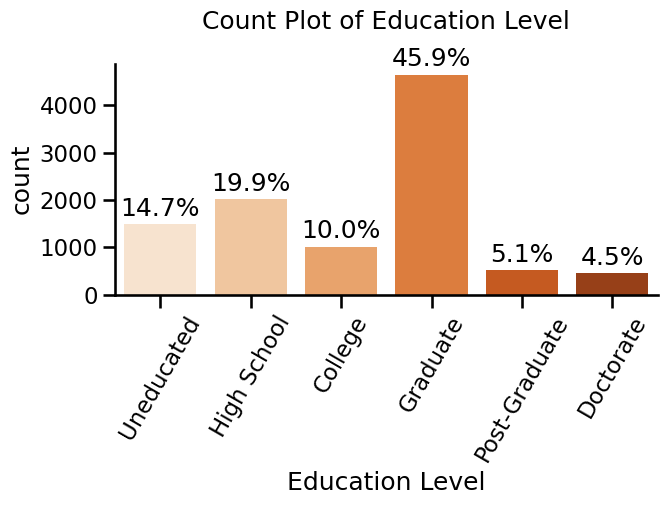

...

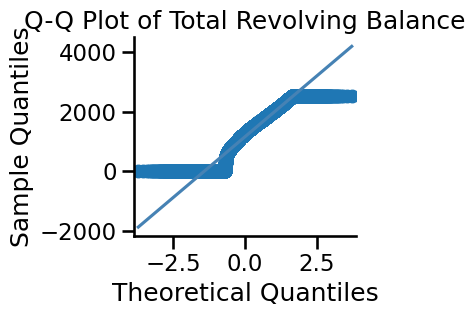

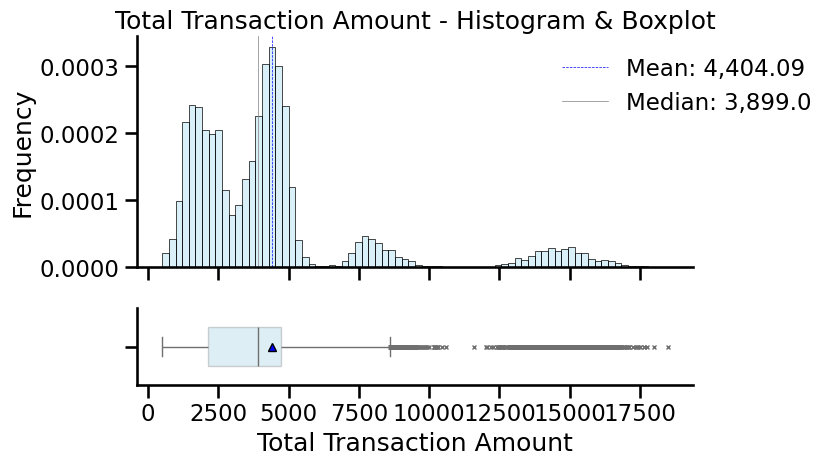

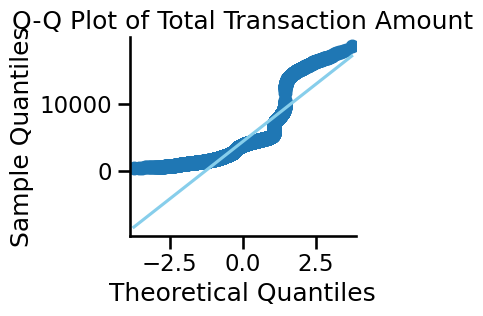

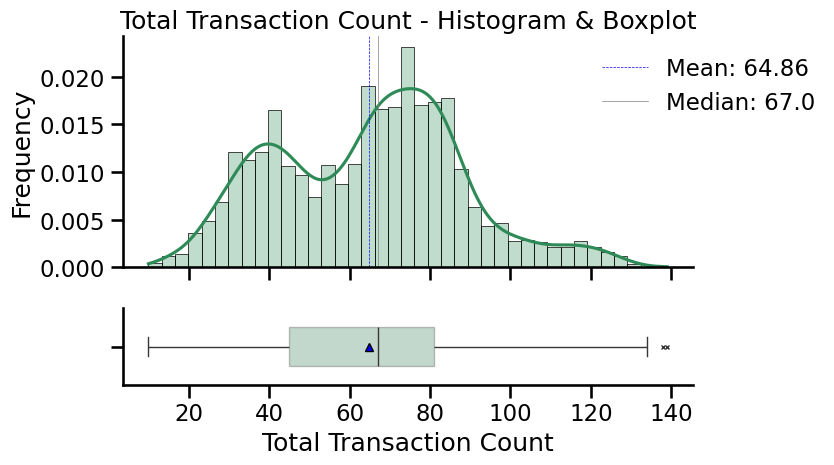

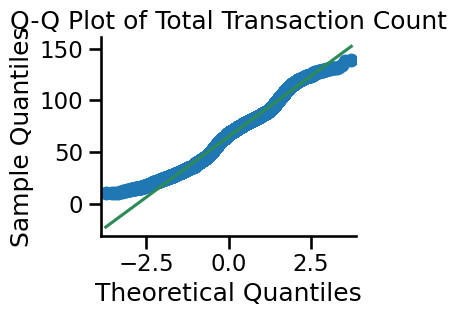

<Figure size 1300x1300 with 0 Axes>

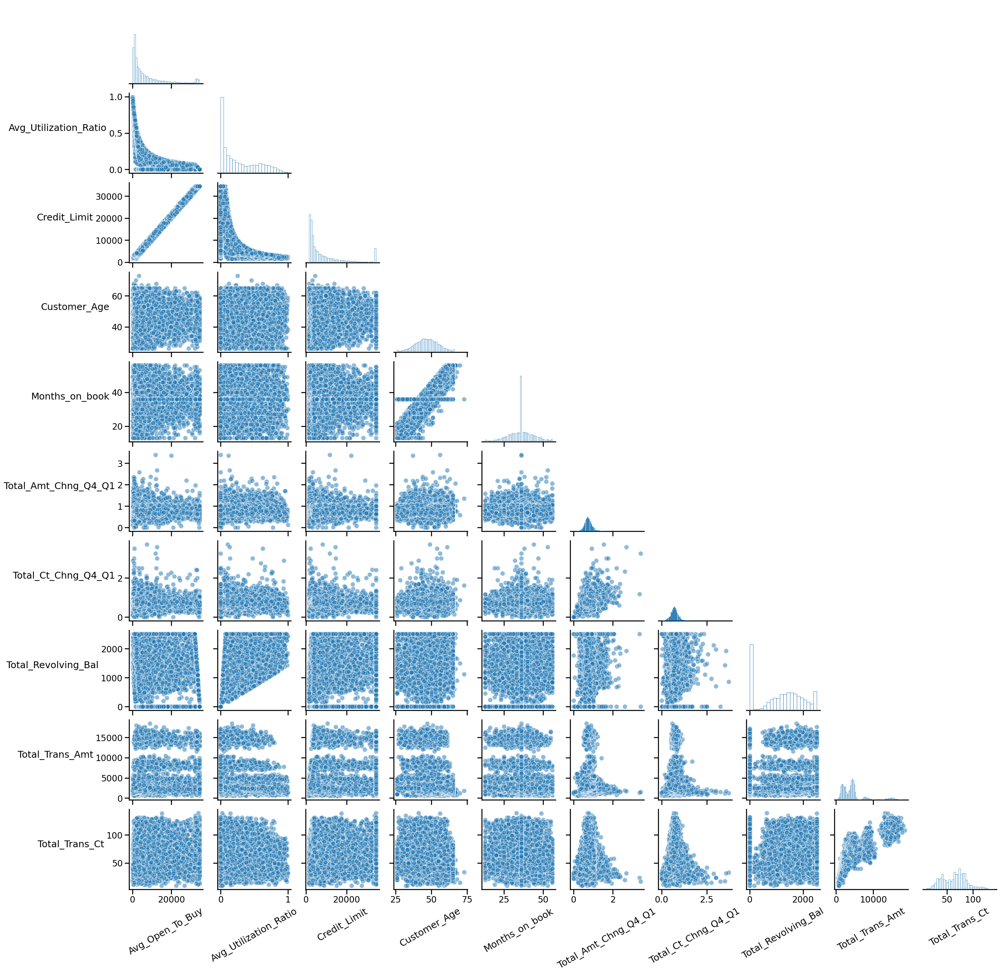

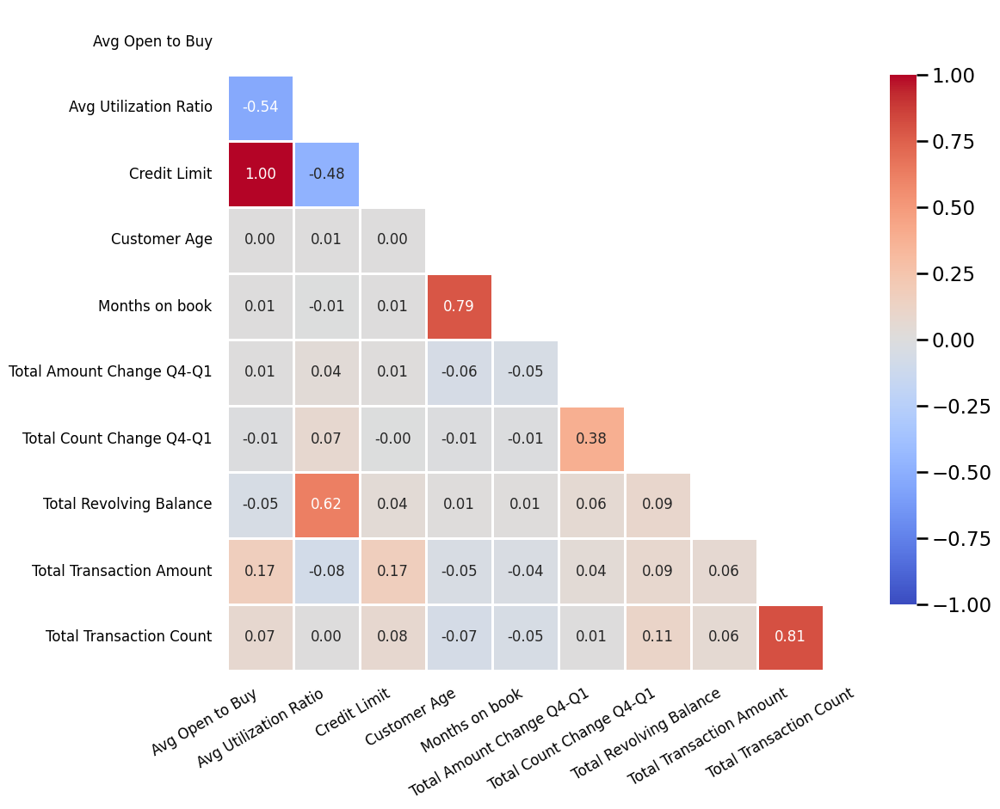

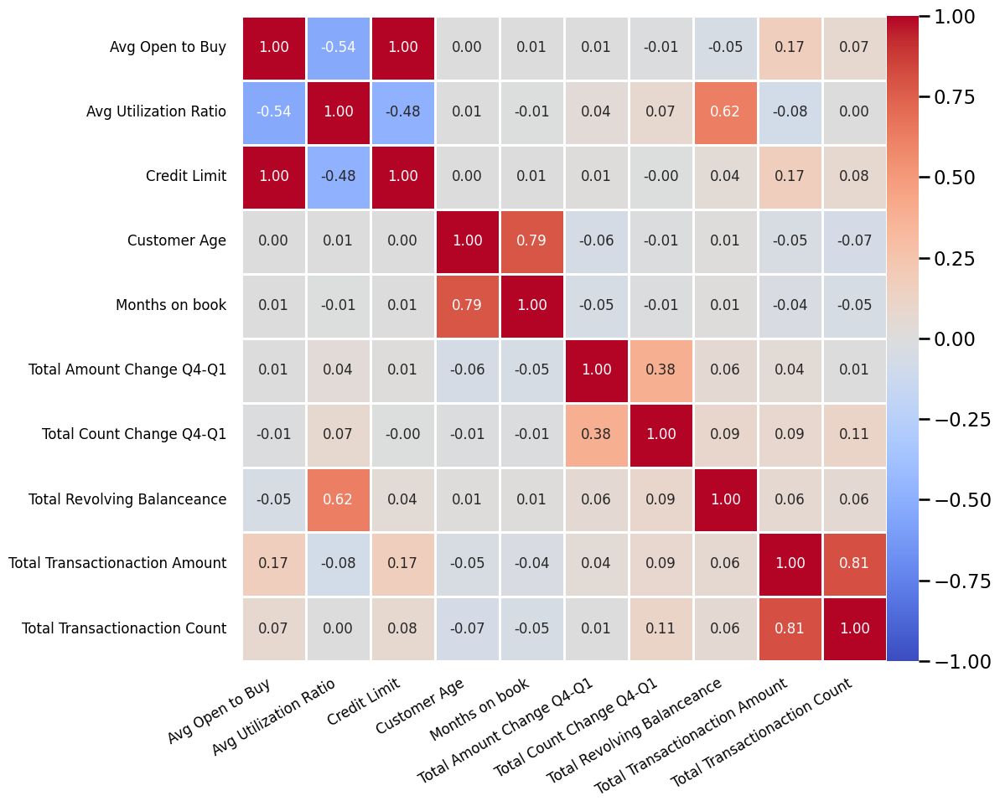

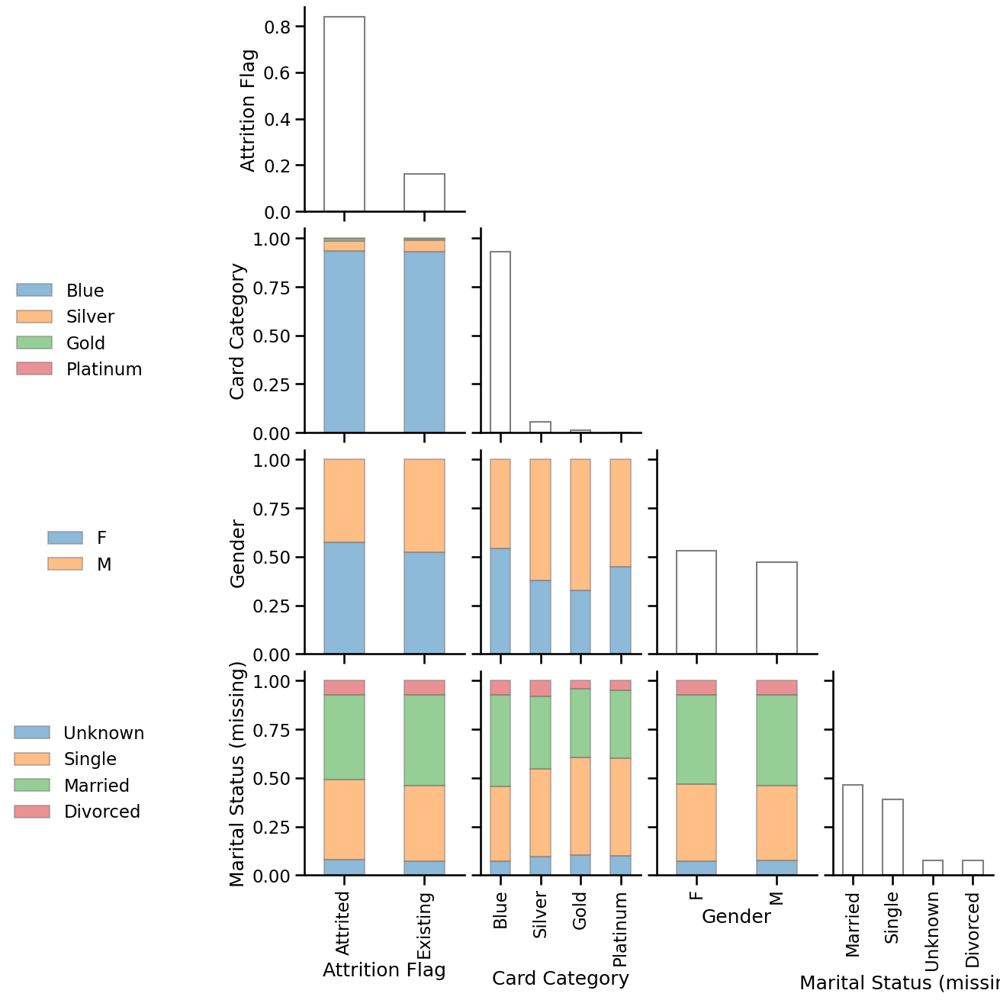

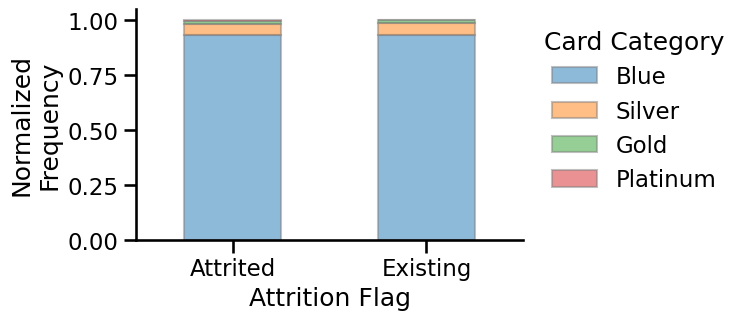

...

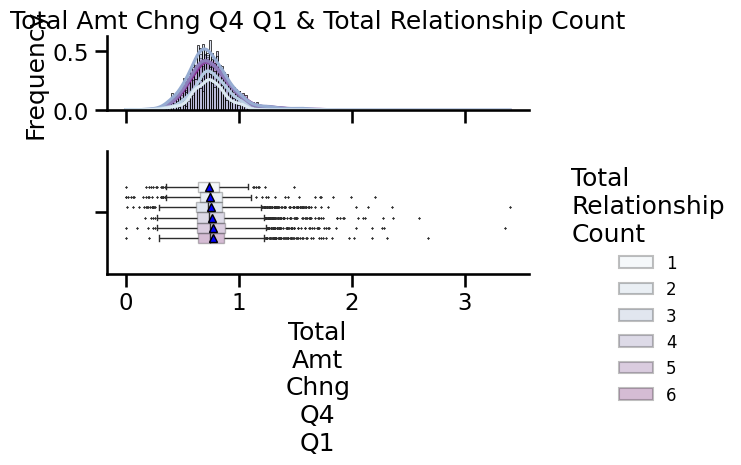

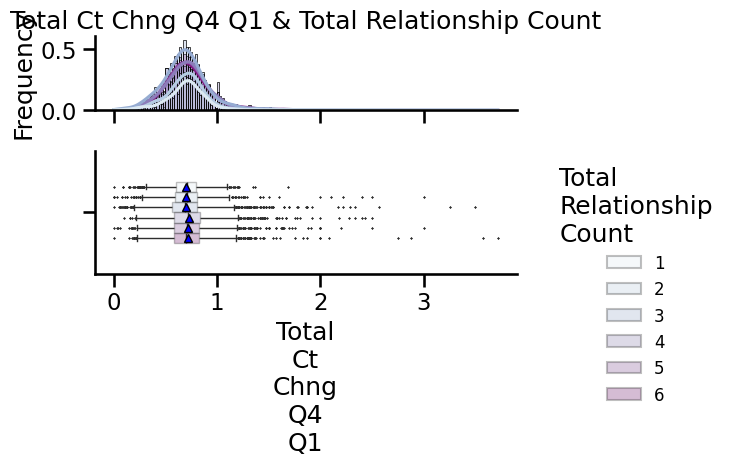

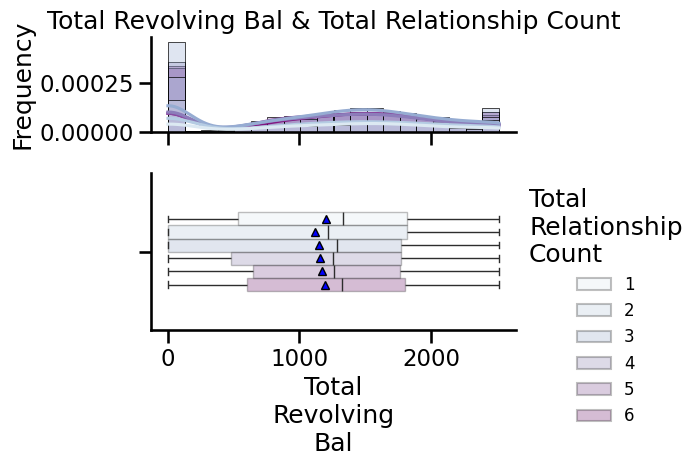

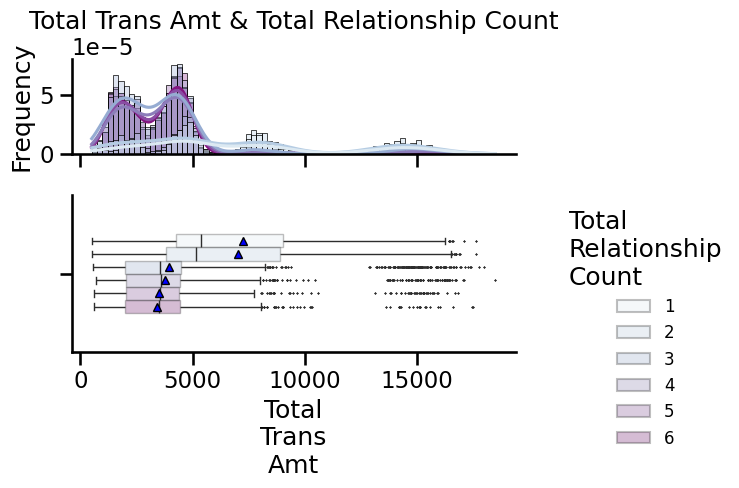

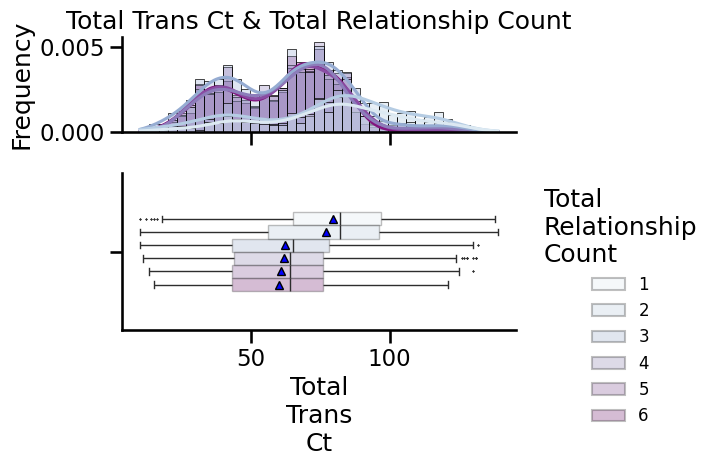

In [17]:
df = create_info_conduct_eda(df.copy(), positive_cols = positive_cols,
                        type_conv = type_conv,
                        feature_info = feature_info,
                  modify_dict = modify_dict,
                            drop_cols = drop_cols, ddict_str = ddict_str,
                             cat_orders=cat_orders, to_plot=True)

In [18]:
df_to_save = df.copy()
df_to_save['Attrition_Flag'] = df_to_save['Attrition_Flag'].map({'Existing': 0, 'Attrited': 1})
cols_with_missing = [c.split(' (missing)')[0] for c in df_to_save.columns if ' (missing)' in c]
cols_with_missing
for c in cols_with_missing:
  df_to_save[c] = df_to_save[f'{c} (missing)']
  df_to_save.drop(f'{c} (missing)', axis=1, inplace=True)
df_to_save.to_csv(f'{data_dir}/BankChurners_clean.csv', index=False)